In [13]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls

# Data Loading 
from keras.preprocessing.image import ImageDataGenerator as IDG

# Data Visualization 
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
from keras.models import Sequential
from tensorflow_hub import KerasLayer as KL
from keras import layers
from keras.layers import Dense, InputLayer, Dropout

# Optimizer
from keras.optimizers import SGD
from keras.optimizers.schedules import PiecewiseConstantDecay as PwCD

# Callbacks
from keras.callbacks import EarlyStopping as ES, ModelCheckpoint as MC

In [2]:
def show_images(data, class_names, model=None, GRID=[5,6], SIZE=(25,25)):
    
    # Plot Configurations
    n_rows, n_cols = GRID
    n_images = n_cols * n_rows
    plt.figure(figsize=SIZE)
    
    # Iterate Through the data
    i = 1
    for images, labels in iter(data):
        
        # Select data Randomly
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]
        
        # Show Image
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        
        # make Prediction
        if model is not None:
            prediction = model.predict(image)[0]
            score = np.round(max(prediction), 2)
            pred = class_names[np.argmax(prediction)]
            title = f"True : {label}\nPred : {pred}"
        else:
            title = label
        
        plt.title(title)
        plt.axis('off')
        cls()
        
        # Break Loop
        i+=1
        if i>n_images:
            break
    
    # Show Final Plot
    plt.show()

In [3]:
train_path = "Fast Food Classification V2\Test"
valid_path = "Fast Food Classification V2\Valid"

In [5]:
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

# Print
print("Num of Classes : {}".format(n_classes))
print("Classes     : {}".format(class_names))

Num of Classes : 10
Classes     : ['Baked Potato', 'Burger', 'Crispy Chicken', 'Donut', 'Fries', 'Hot Dog', 'Pizza', 'Sandwich', 'Taco', 'Taquito']


In [9]:
train_gen = IDG(rescale=1./255, rotation_range=10, horizontal_flip=True, vertical_flip=False)
valid_gen = IDG(rescale=1./255)

# Load the datasets
train_ds = train_gen.flow_from_directory(train_path, shuffle=True, batch_size=64, target_size=(256,256), class_mode='binary')
valid_ds = valid_gen.flow_from_directory(valid_path, shuffle=True, batch_size=32, target_size=(256,256), class_mode='binary')

Found 1500 images belonging to 10 classes.
Found 3500 images belonging to 10 classes.


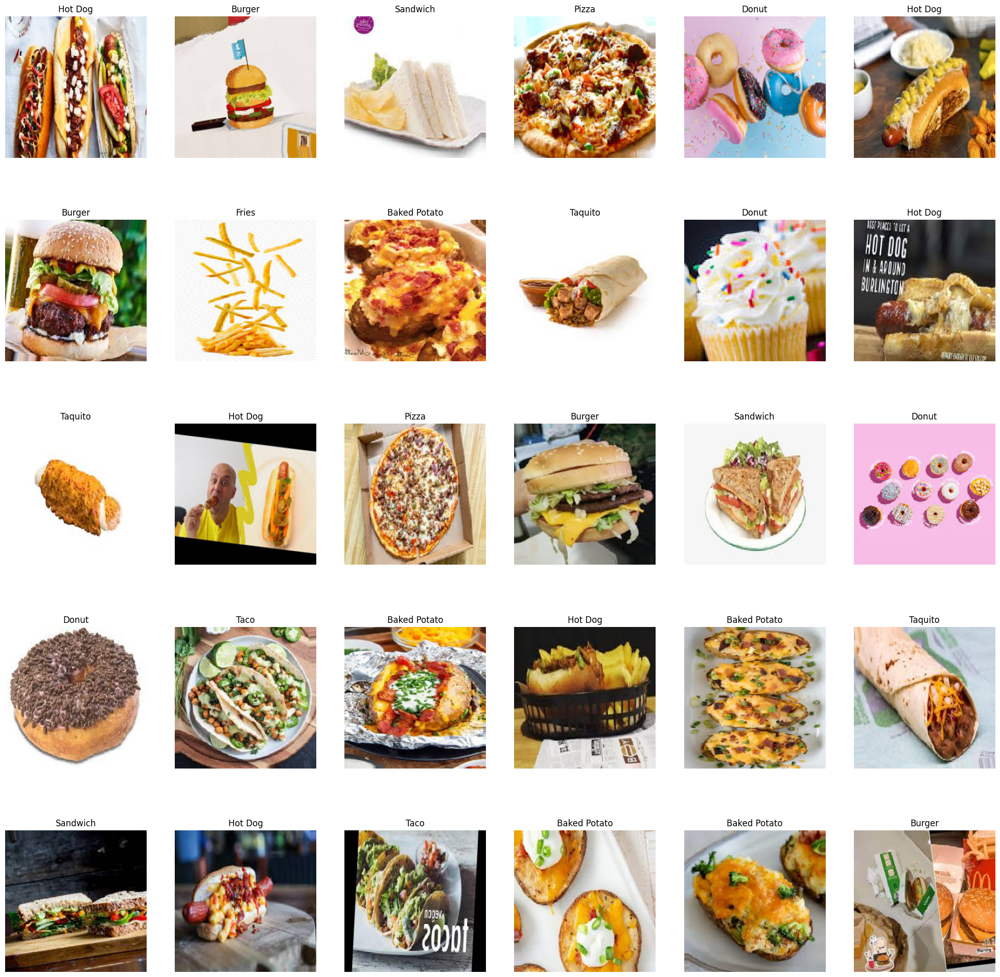

In [10]:
show_images(data=train_ds, class_names=class_names)

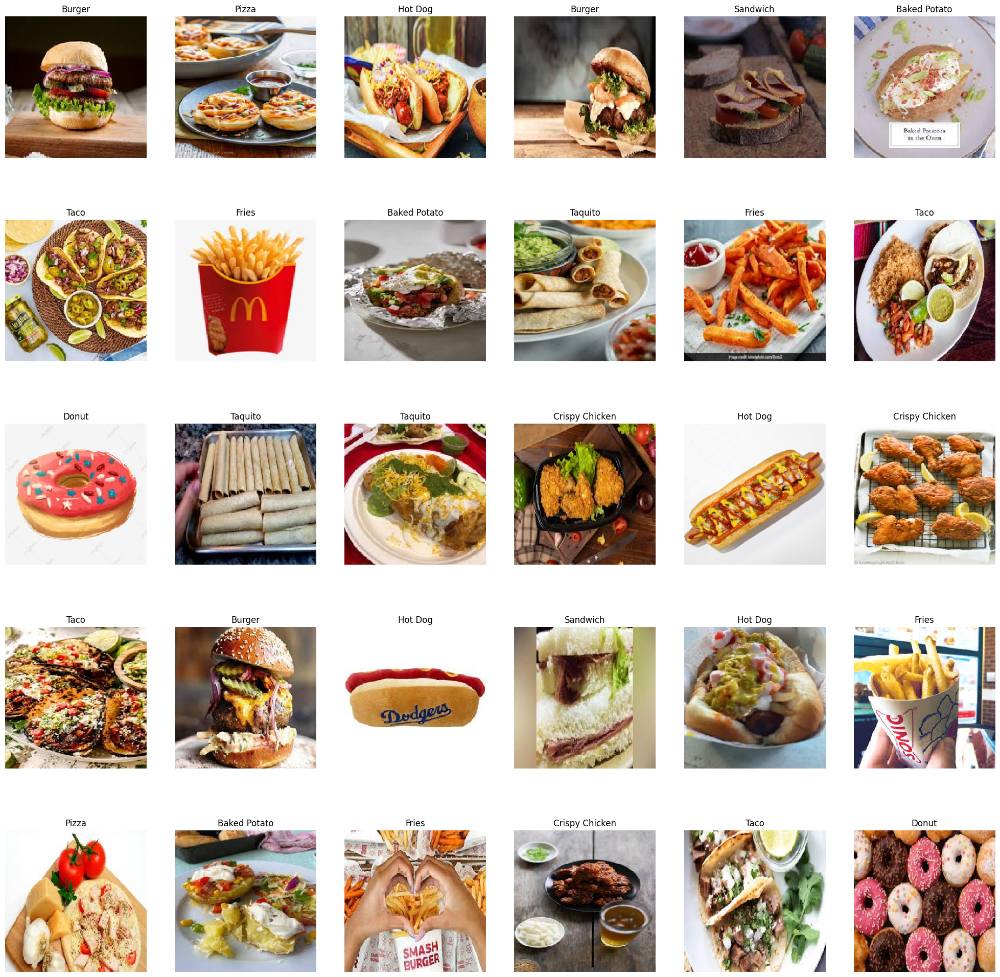

In [11]:
show_images(data=valid_ds, class_names=class_names)

In [15]:
url = "https://tfhub.dev/google/bit/m-r50x1/1"

# Load Model
bit = KL(url)

# Model Name
model_name = "Fast-Food-Classification-BiT"

# Model Architecture
model = Sequential([
    InputLayer(input_shape=(256, 256, 3)),
    bit,
    Dropout(0.2),
    Dense(n_classes, activation='softmax', kernel_initializer='zeros')
], name=model_name)

# Model Summary
model.summary()

Model: "Fast-Food-Classification-BiT"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 2048)              23500352  
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 10)                20490     
                                                                 
Total params: 23520842 (89.72 MB)
Trainable params: 20490 (80.04 KB)
Non-trainable params: 23500352 (89.65 MB)
_________________________________________________________________


In [16]:
lr = 5e-3

lr_scheduler = PwCD(boundaries=[200,300,400],values=[lr*0.1, lr*0.01, lr*0.001, lr*0.0001])

opt = SGD(learning_rate=lr_scheduler, momentum=0.9)

# Compile
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=opt,
    metrics=['accuracy']
)

In [18]:
cbs = [ES(patience=5, restore_best_weights=True), MC(model_name+".h5", save_best_only=True)]

# Training
history = model.fit(train_ds, validation_data=valid_ds, epochs=5, callbacks=cbs)

Epoch 1/5
24/24 [==============================] - 727s 31s/step - loss: 0.1305 - accuracy: 0.9700 - val_loss: 0.5269 - val_accuracy: 0.8486
Epoch 2/5
24/24 [==============================] - 659s 28s/step - loss: 0.1275 - accuracy: 0.9700 - val_loss: 0.5477 - val_accuracy: 0.8397
Epoch 3/5
24/24 [==============================] - 695s 30s/step - loss: 0.1156 - accuracy: 0.9707 - val_loss: 0.5162 - val_accuracy: 0.8489
Epoch 4/5
24/24 [==============================] - 665s 29s/step - loss: 0.1107 - accuracy: 0.9740 - val_loss: 0.5363 - val_accuracy: 0.8440
Epoch 5/5
24/24 [==============================] - 667s 29s/step - loss: 0.1075 - accuracy: 0.9753 - val_loss: 0.5826 - val_accuracy: 0.8351


In [19]:
lc = pd.DataFrame(history.history)
lc

,loss,accuracy,val_loss,val_accuracy
0,0.130479,0.970000,0.526946,0.848571
1,0.127507,0.970000,0.547680,0.839714
2,0.115564,0.970667,0.516248,0.848857
3,0.110663,0.974000,0.536336,0.844000
4,0.107514,0.975333,0.582571,0.835143


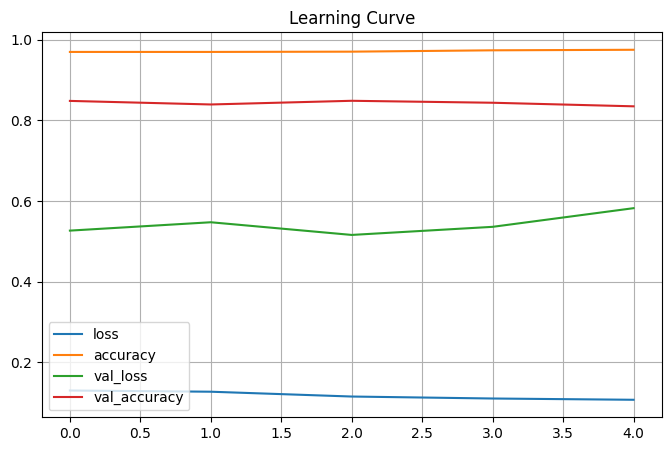

In [20]:
lc.plot(figsize=(8,5))
plt.title("Learning Curve")
plt.grid()

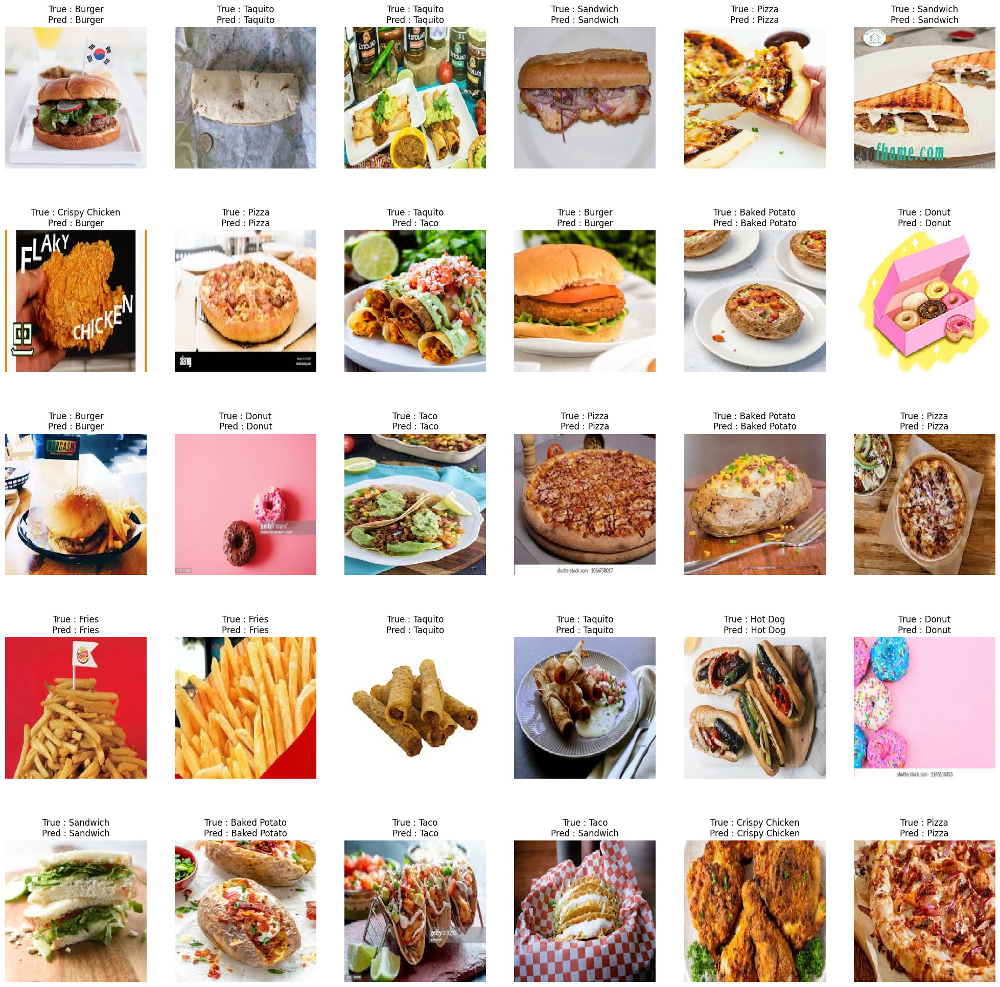

In [21]:
show_images(data=valid_ds, class_names=class_names, model=model)